# Tutorial 4 : Attentive Neural Processes Variants - 1D GP Hard Data

Last Update : 22 June 2019

**Aim**: 
- Investigating variants of [Attentive Neural Process] (ANP)
- Showing how to use the library to build more complicated models
- Use a more complicated dataset where the hyperparameters of the kernel vary

**Nota Bene:**
- Much of the work below does not follow any paper
- Much more details about the framework and dataset can be found in [Tutorial 1 - Conditional Neural Process].

[Attentive Neural Process]: https://arxiv.org/abs/1901.05761
[Tutorial 1 - Conditional Neural Process]: Tutorial%201%20-%20Conditional%20Neural%20Process.ipynb

**Environment Hypermarameters:**

In [1]:
N_THREADS = 8
# Nota Bene : notebooks don't deallocate GPU memory
IS_FORCE_CPU = False # can also be set in the trainer

## Environment

In [2]:
cd ..

/master


In [3]:
%autosave 600
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# CENTER PLOTS
from IPython.core.display import HTML
display(HTML(""" <style> .output_png {display: table-cell; text-align: center; margin:auto; }
.prompt display:none;}  </style>"""))

import os
if IS_FORCE_CPU:
    os.environ['CUDA_VISIBLE_DEVICES'] = ""

import sys
sys.path.append("notebooks")

import numpy as np
import matplotlib.pyplot as plt
import torch
torch.set_num_threads(N_THREADS)

Autosaving every 600 seconds


## Dataset

In this notebook I only look at the periodic and mattern kernel as these seem the harder to learn and sample uniformyl hyperparameters of the kernels at each epoch (i.e. kernel is not fixed). See [Tutorial 1 - Conditional Neural Process] for more details.

[Tutorial 1 - Conditional Neural Process]: Tutorial%201%20-%20Conditional%20Neural%20Process.ipynb

In [4]:
X_DIM = 1  # 1D spatial input
Y_DIM = 1  # 1D regression
N_POINTS = 128
N_SAMPLES = 100000 # this is a lot and can work with less

In [14]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ExpSineSquared
from utils.visualize import plot_posterior_samples, plot_prior_samples, plot_dataset_samples
from utils.datasets import GPDataset

def get_hard_gp_datasets(n_samples=100000, n_points=128, n_diff_kernel_hyp=1000):
    """
    Return different 1D functions sampled from GPs with the following kernels:
    "periodic", "noisy-matern" and randomly sample hyperparameters at each epoch.
    """
    datasets = dict()
    kwargs = dict(n_samples=n_samples, n_points=n_points, n_diff_kernel_hyp=n_diff_kernel_hyp)
    datasets["periodic"] = GPDataset(kernel=ExpSineSquared(length_scale_bounds=(0.1, .5),
                                                           periodicity_bounds=(1., 3.)),
                                     **kwargs)
    datasets["noisy-matern"] = GPDataset(kernel=(WhiteKernel(noise_level_bounds=(1e-3, 1e-1)) +
                                                 Matern(length_scale_bounds=(0.05, .2), nu=1.5)),
                                         **kwargs)
    return datasets

In [15]:
datasets = get_hard_gp_datasets(n_samples=N_SAMPLES, n_points=N_POINTS)

Let's visualize some of the uncoditional samples from the dataset:

In [16]:
from utils.visualize import plot_posterior_samples, plot_prior_samples, plot_dataset_samples

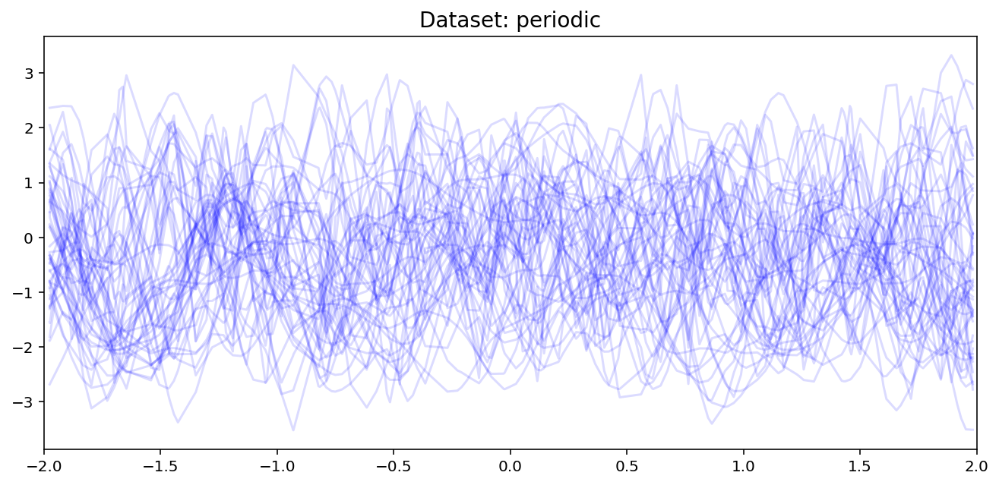

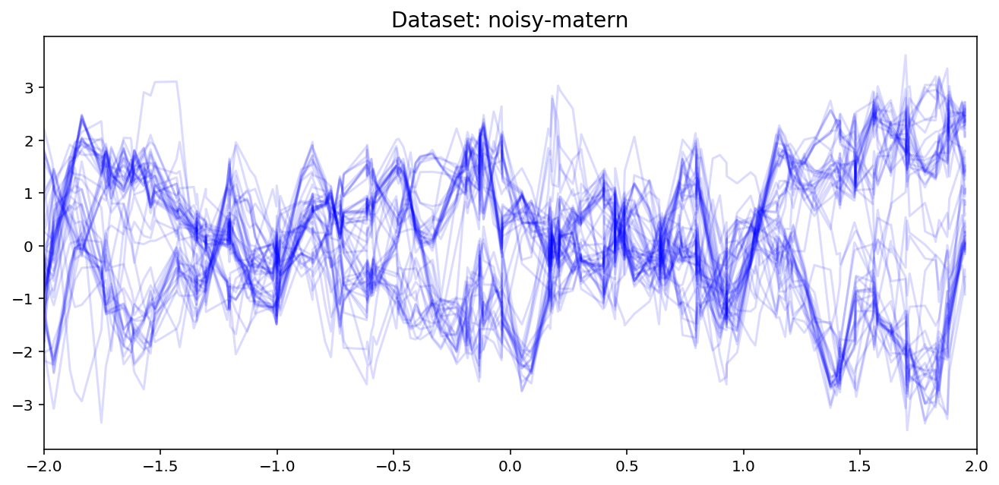

In [17]:
for k, dataset in datasets.items():
    plot_dataset_samples(dataset, title="Dataset: {}".format(k))

## Model

The general model architecture is slightly different from the paper to make it modular and easy to extend, but it is easy to make them equivalent with the right parameters. Refer to [Tutorial 1 - Conditional Neural Process] for an overview main parameters or the docstrings of `NeuralProcess` for all parameters. 

[Tutorial 1 - Conditional Neural Process]: Tutorial%201%20-%20Conditional%20Neural%20Process.ipynb

In [18]:
from torch.distributions import Normal
from neuralproc import AttentiveNeuralProcess, SelfAttentionBlock, SinusoidalEncodings, NeuralProcessLoss
from neuralproc.utils.datasplit import CntxtTrgtGetter, GetRandomIndcs

R_DIM = 128
get_cntxt_trgt = CntxtTrgtGetter(contexts_getter=GetRandomIndcs(min_n_indcs=0.05, max_n_indcs=.5),
                                 targets_getter=GetRandomIndcs(min_n_indcs=0.05, max_n_indcs=.5),
                                 is_add_cntxts_to_trgts=True)  # add all context points to tagrtes

def init_models():
    return {"Conditional_ANP":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  r_dim=R_DIM,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  encoded_path="deterministic",
                                  attention="transformer"),
     
     "ANP":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  r_dim=R_DIM,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  attention="transformer", 
                                  encoded_path="both") ,
     
     "Sinusoidal_ANP":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  XEncoder=SinusoidalEncodings, # sinusoidal encodings
                                  r_dim=R_DIM,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  attention="transformer", 
                                  encoded_path="both") ,
     
     "SelfAttn_Enc_ANP":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  XYEncoder=SelfAttentionBlock,  # self attention encoder 
                                  r_dim=R_DIM,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  attention="transformer", 
                                  encoded_path="both") ,
     
     "SelfAttn_Dec_ANP":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  Decoder=SelfAttentionBlock,  # self attention decoder 
                                  r_dim=R_DIM,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  attention="transformer", 
                                  encoded_path="both"),
     
     "r64_Transformer_Process":AttentiveNeuralProcess(X_DIM, Y_DIM,
                                  XEncoder=SinusoidalEncodings, # sinusoidal encodings
                                  XYEncoder=SelfAttentionBlock,  # self attention encoder 
                                  Decoder=SelfAttentionBlock,  # self attention decoder 
                                  r_dim=64,
                                  get_cntxt_trgt=get_cntxt_trgt,
                                  attention="transformer", 
                                  encoded_path="both")}

# initialize all model for each dataset
data_models = {name: (init_models(), data) 
               for name, data in datasets.items()}


/master/neuralproc/utils/torchextend.py:53: UserWarning: hidden_size=32 smaller than output=128 and input=128. Setting it to 128.
  warnings.warn(txt.format(hidden_size, output_size, input_size, self.hidden_size))
/master/neuralproc/utils/torchextend.py:53: UserWarning: hidden_size=32 smaller than output=256 and input=128. Setting it to 128.
  warnings.warn(txt.format(hidden_size, output_size, input_size, self.hidden_size))
/master/neuralproc/utils/torchextend.py:53: UserWarning: hidden_size=32 smaller than output=128 and input=64. Setting it to 64.
  warnings.warn(txt.format(hidden_size, output_size, input_size, self.hidden_size))


### N Param

Number of parameters (note that I did not play around with this much, this depends a lot on the representation size):

In [19]:
from utils.helpers import count_parameters

In [20]:
for k, (models, dataset) in data_models.items():
    for name, model in models.items():
        print("N Param for {}:".format(name), count_parameters(model))
    break

N Param for Conditional_ANP: 181186
N Param for ANP: 263618
N Param for Sinusoidal_ANP: 259330
N Param for SelfAttn_Enc_ANP: 379458
N Param for SelfAttn_Dec_ANP: 388866
N Param for r64_Transformer_Process: 127362


## Training

In [27]:
IS_RETRAIN = False

In [28]:
from torch.optim import Adam
from skorch.callbacks import ProgressBar, Checkpoint
from skorch import NeuralNet
from utils.helpers import get_only_first_item

for k,(models, dataset) in data_models.items():
    for name, neural_proc in models.items():
        
        print()
        print("--- {} {} ---".format("Training" if IS_RETRAIN else "Loading", k + " " + name))
        print()

        chckpt = Checkpoint(dirname="results/notebooks/neural_process/variants/{}_{}".format(name, k), 
                            monitor='train_loss_best') # train would be same as validation as always resamples

        model = NeuralNet(neural_proc, NeuralProcessLoss,
                          iterator_train__shuffle=True, # shuffle iterator
                          train_split=None,  # don't use cross validation dev set
                          warm_start=True, # continue training if stop and restart
                          device="cuda" if torch.cuda.is_available() else "cpu",
                          optimizer=Adam,
                          max_epochs=50, 
                          batch_size=64,
                          lr=1e-3, # they use 5e-5 because 16 batch size but that would be slow
                          callbacks=[ProgressBar(), chckpt]) 

        if IS_RETRAIN:
            # give both X and y to `forward`
            _=model.fit({'X': get_only_first_item(dataset), "y": dataset.targets})

        model.initialize()
        model.load_params(checkpoint=chckpt)


--- Loading periodic Conditional_ANP ---


--- Loading periodic ANP ---


--- Loading periodic Sinusoidal_ANP ---


--- Loading periodic SelfAttn_Enc_ANP ---


--- Loading periodic SelfAttn_Dec_ANP ---


--- Loading periodic r64_Transformer_Process ---


--- Loading noisy-matern Conditional_ANP ---


--- Loading noisy-matern ANP ---


--- Loading noisy-matern Sinusoidal_ANP ---


--- Loading noisy-matern SelfAttn_Enc_ANP ---


--- Loading noisy-matern SelfAttn_Dec_ANP ---


--- Loading noisy-matern r64_Transformer_Process ---



# Trained Prior

In [29]:
EXTRAP_DISTANCE = 2  # add 2 to the right for extrapolation
INTERPOLATION_RANGE = dataset.min_max
EXTRAPOLATION_RANGE = (dataset.min_max[0], dataset.min_max[1]+EXTRAP_DISTANCE )

std: 0.43772711187601093
std: 0.4132938575744629
std: 0.8421973872184754
std: 0.4203341645002364
std: 0.4439890095591545
std: 0.7032917463779449
std: 0.36788371577858925
std: 0.41955402791500096
std: 0.8577058655023574
std: 0.44536004155874254
std: 0.4079868349432945
std: 0.6949248510599139


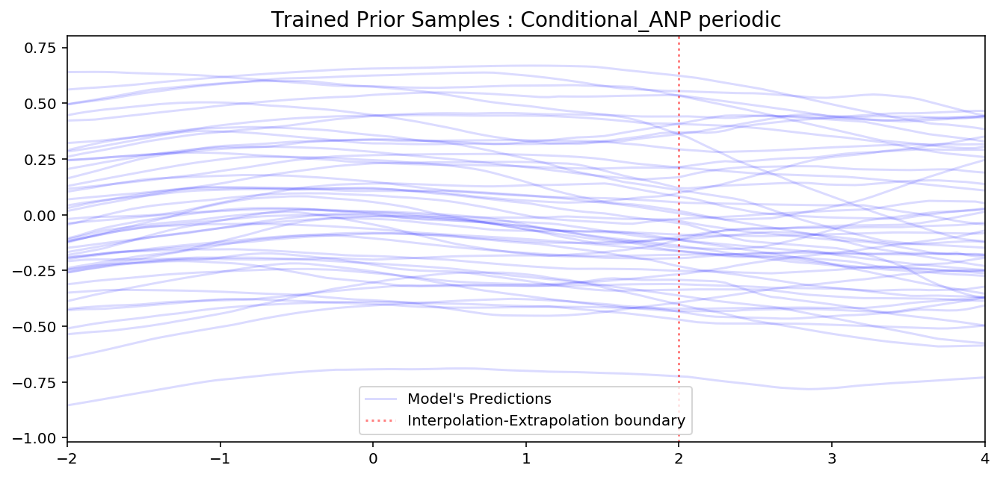

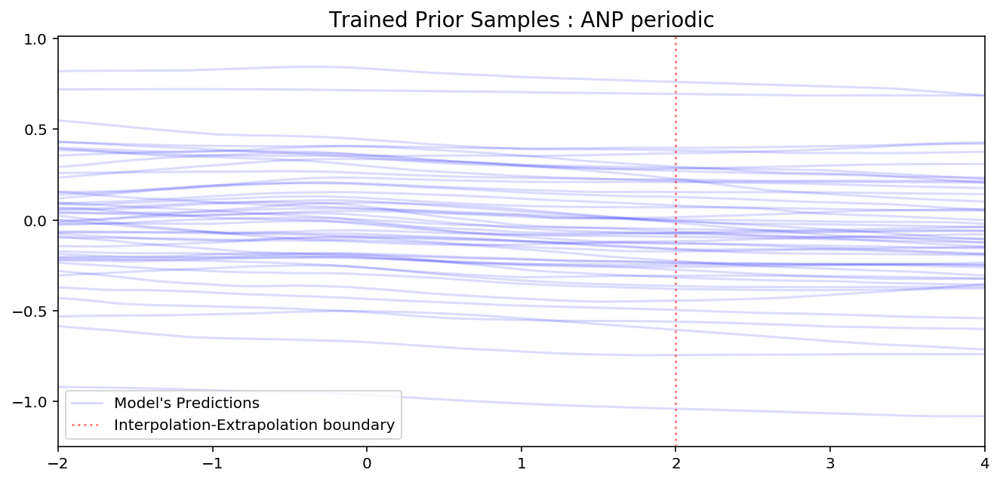

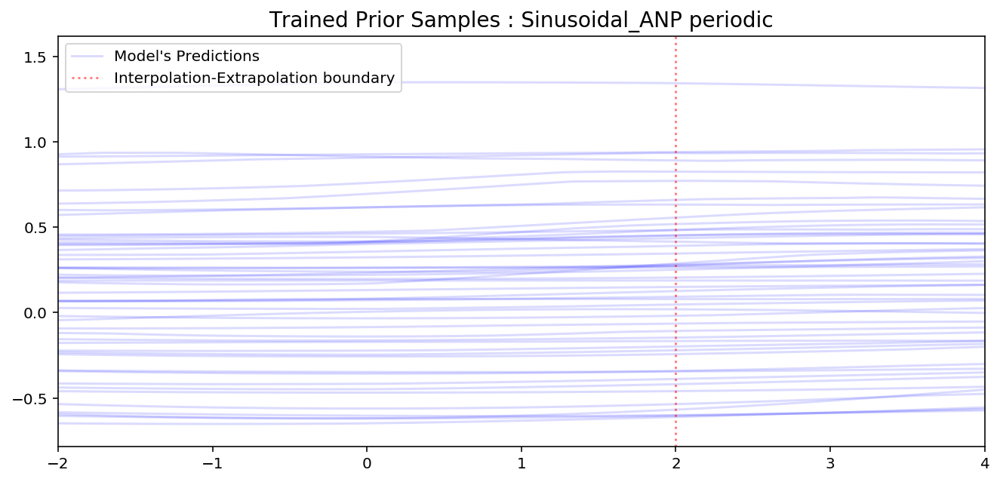

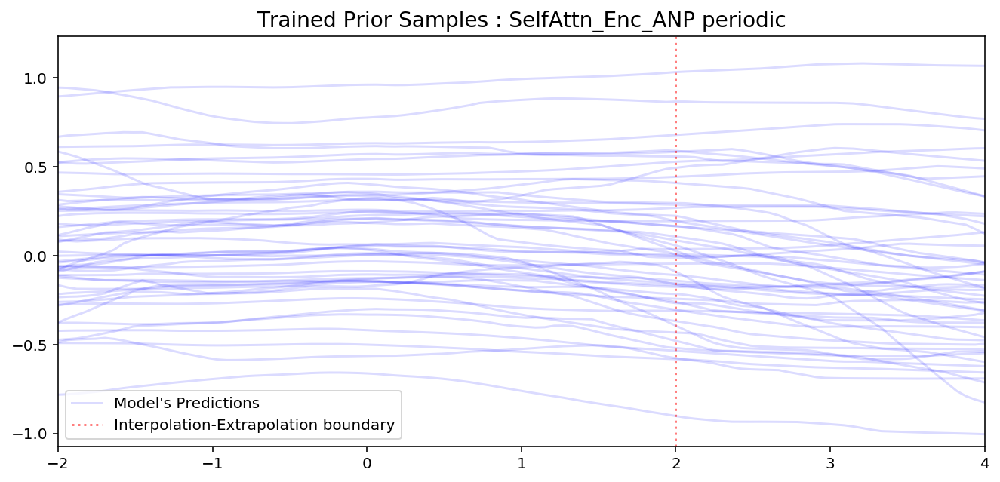

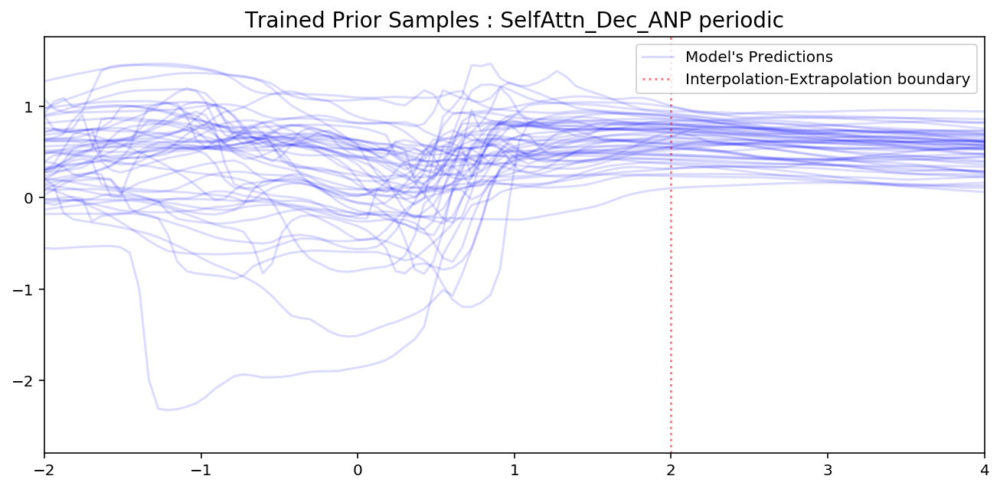

...

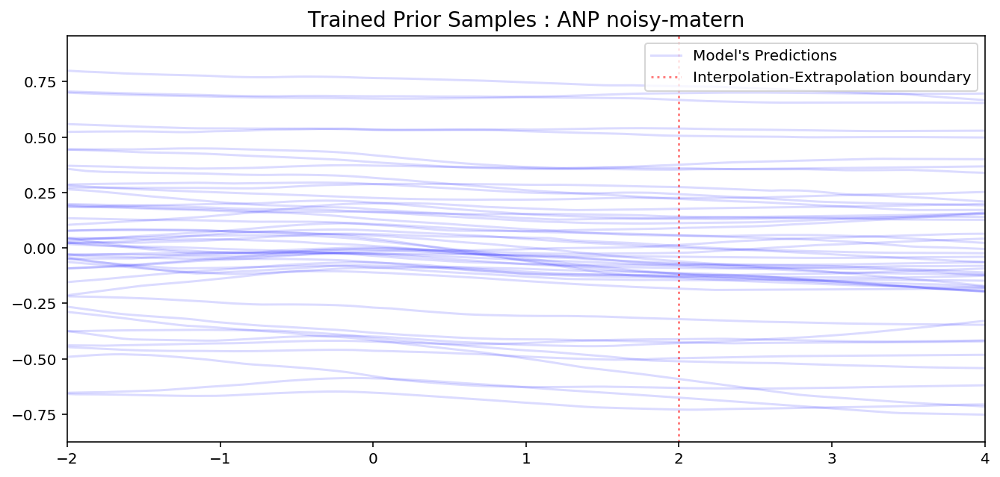

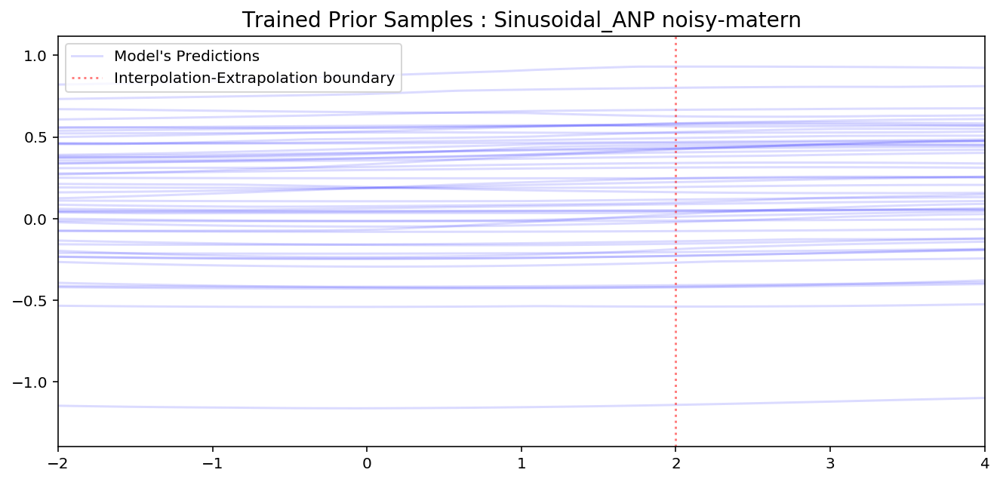

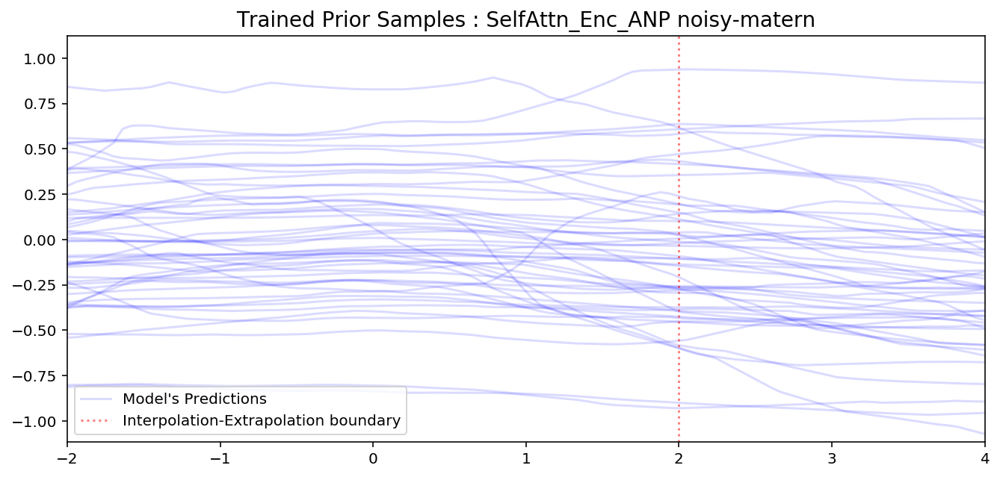

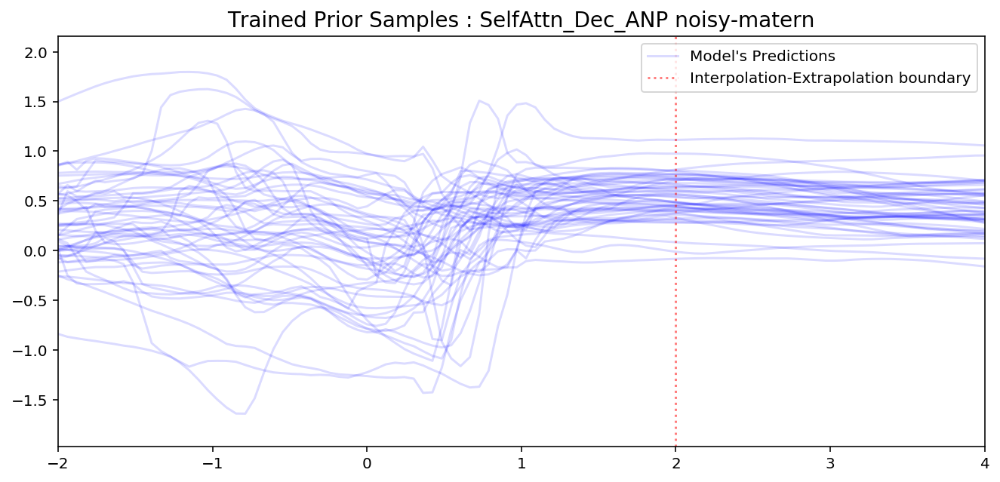

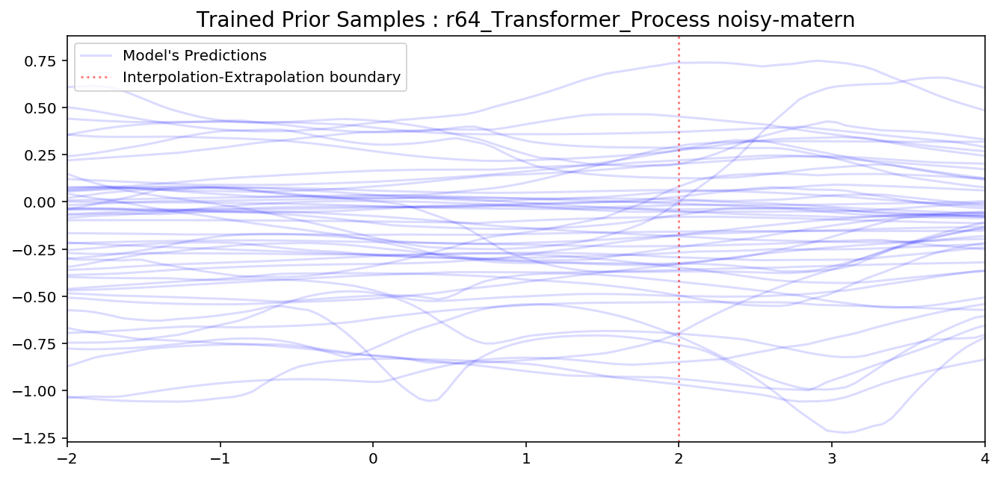

In [30]:
for k,(neural_proc, dataset) in data_models.items():
    for name, neural_proc in models.items():
        plot_prior_samples(neural_proc, 
                           title="Trained Prior Samples : {} {}".format(name, k), 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           train_min_max=INTERPOLATION_RANGE)

# Posterior

In [31]:
def fix_dataset(dataset):
    """Fix dataset to be comparable for all models."""
    dataset.n_diff_kernel_hyp = 1 # deactivate sampling to have same for all
    if k == 'noisy-matern':
        dataset.generator.kernel.set_params(k1__noise_level=.05)  
        dataset.generator.kernel.set_params(k2__length_scale=.1)
    elif k == "periodic": 
        dataset.generator.kernel.set_params(periodicity=1) 
        dataset.generator.kernel.set_params(length_scale=.1)


Number of context points: 2
Dataset: periodic
std: 0.9284733533859265
std: 1.041028892993927
std: 0.7523005926609039
std: 1.0388045763969422
std: 1.0129566621780395
std: 0.908853089809418
Dataset: noisy-matern
std: 1.0276029109954838
std: 1.002252326011658
std: 1.0446576571464543
std: 0.9992472541332245
std: 1.0626222252845763
std: 1.0362111210823062

Number of context points: 10
Dataset: periodic
std: 0.7847098112106322
std: 0.9328536736965181
std: 0.9159469151496888
std: 0.919005699157715
std: 1.0455822324752808
std: 0.902570023536682
Dataset: noisy-matern
std: 0.8502200841903678
std: 0.932444223165512
std: 0.885242055654526
std: 0.9013874781131743
std: 1.016502447128296
std: 0.9459116852283478

Number of context points: 20
Dataset: periodic
std: 0.8163940906524665
std: 0.8573690366744995
std: 0.834026246070862
std: 0.9344353866577149
std: 0.9024791991710662
std: 0.8717691123485566
Dataset: noisy-matern
std: 0.791682541370392
std: 0.9007660233974454
std: 0.8316329574584963
std: 0.86

/usr/local/lib/python3.6/dist-packages/sklearn/gaussian_process/gpr.py:469: ConvergenceWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-1.18202840e+00,  2.88304693e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 5, 'warnflag': 2}
  ConvergenceWarning)


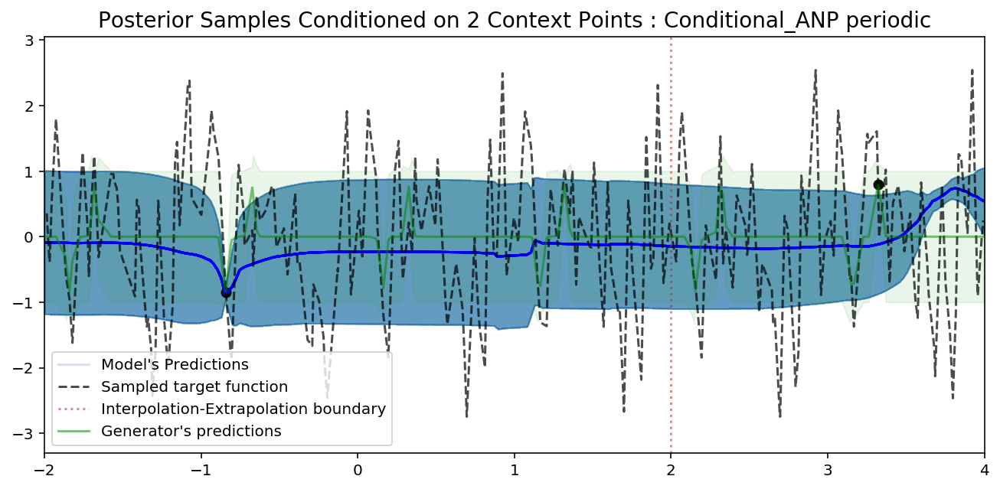

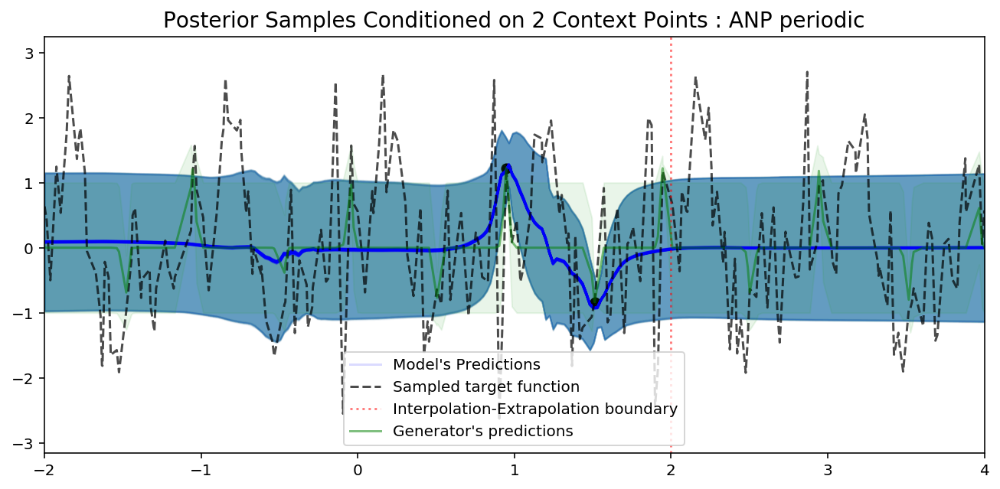

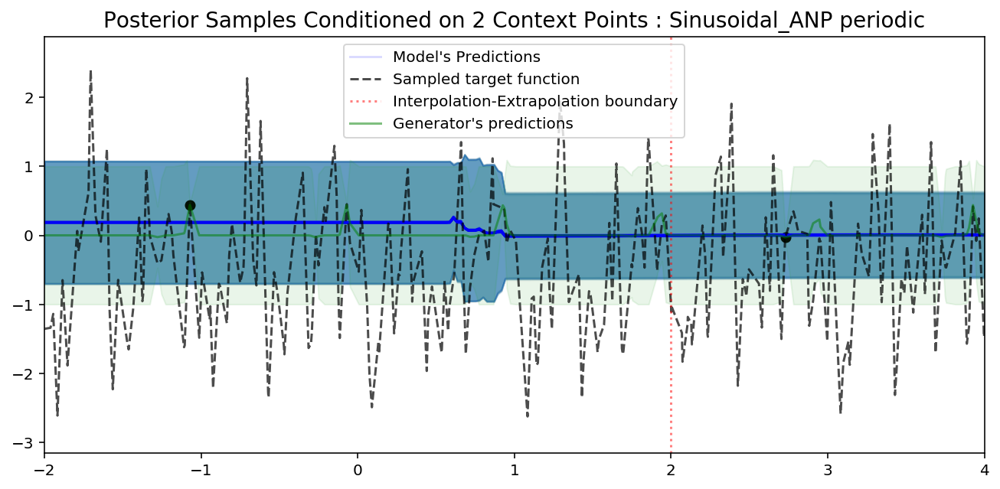

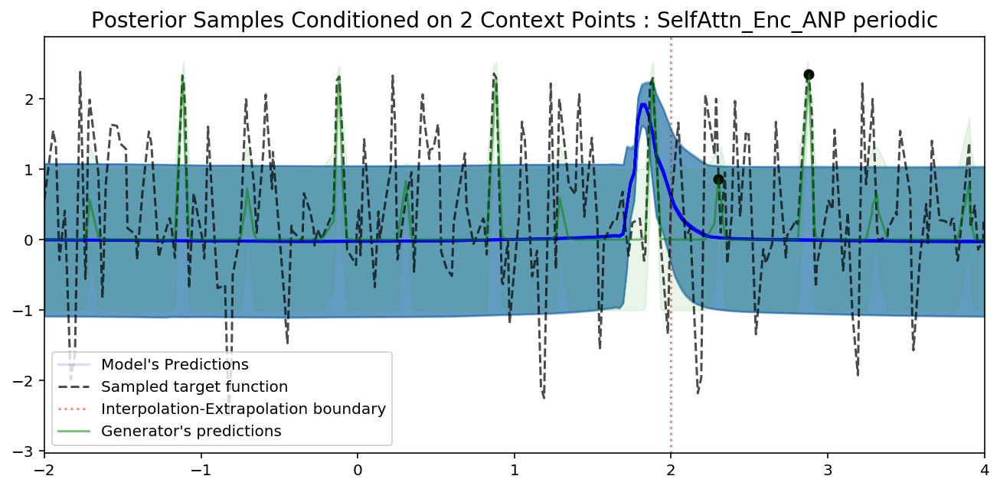

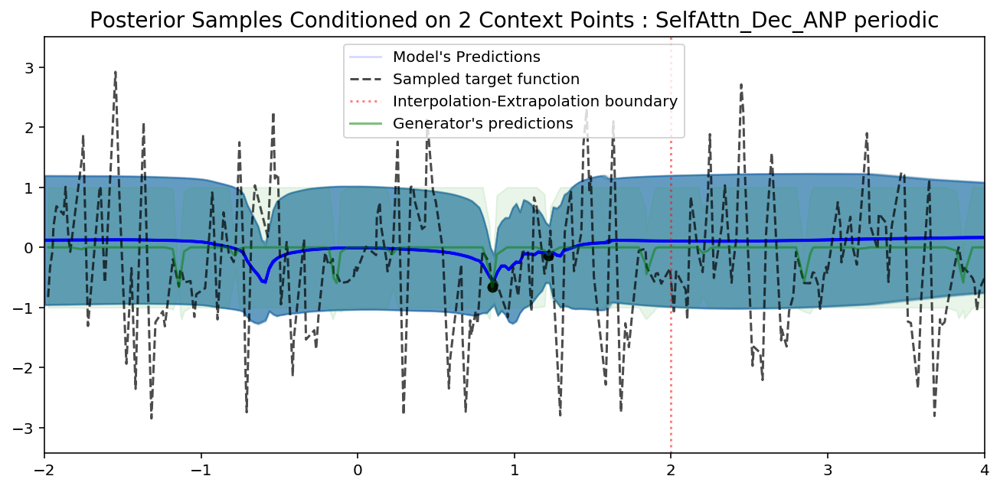

...

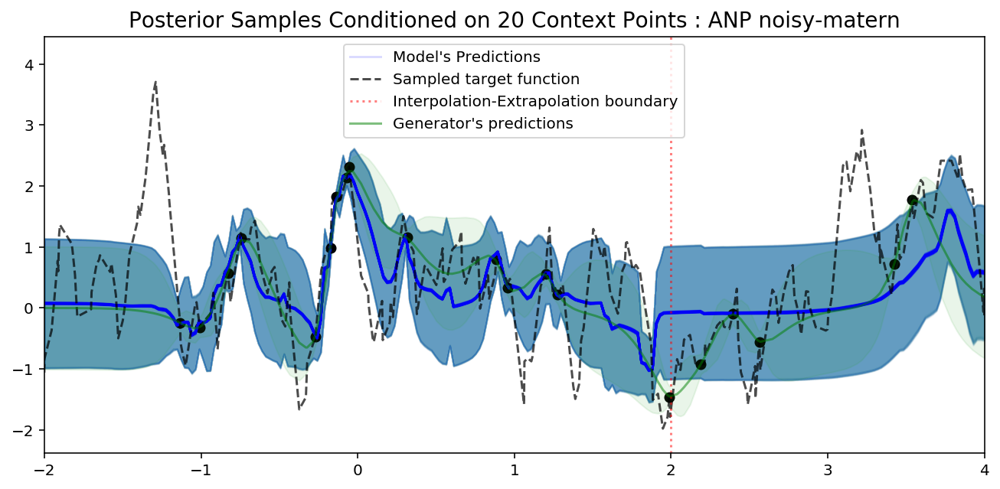

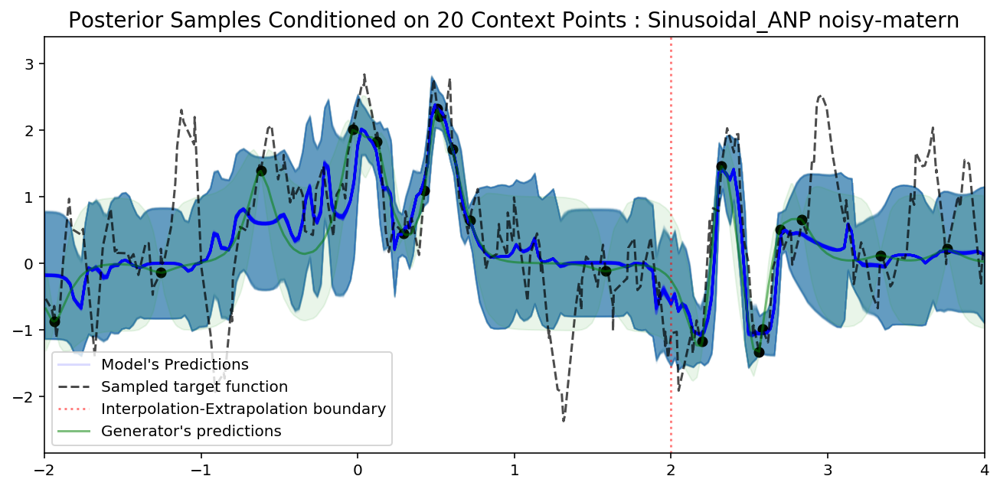

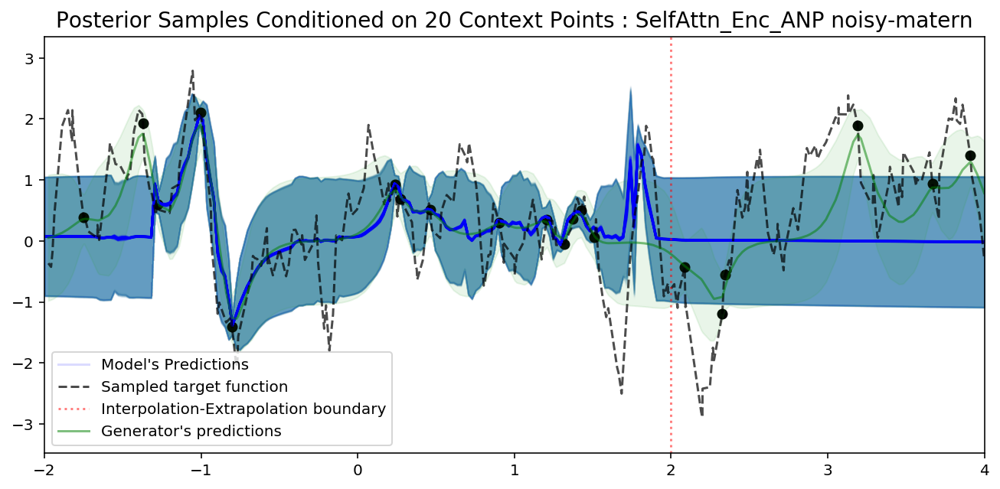

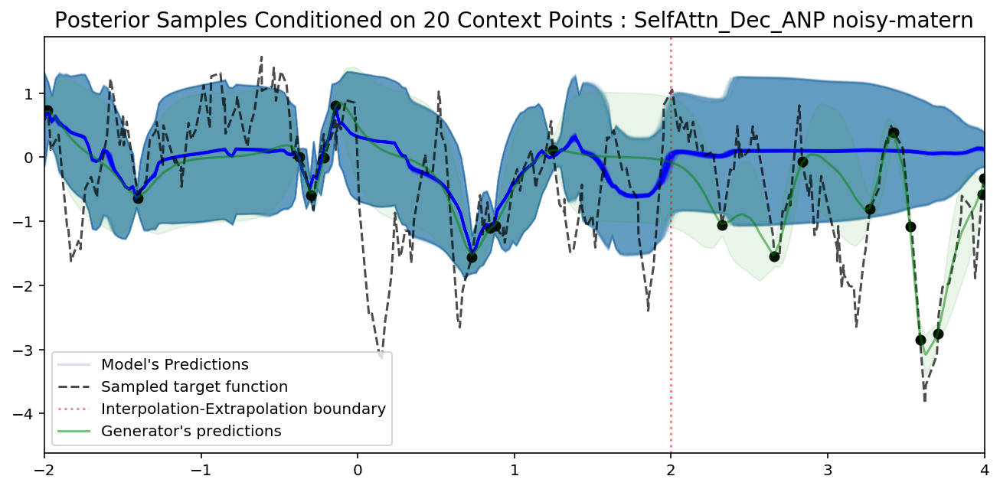

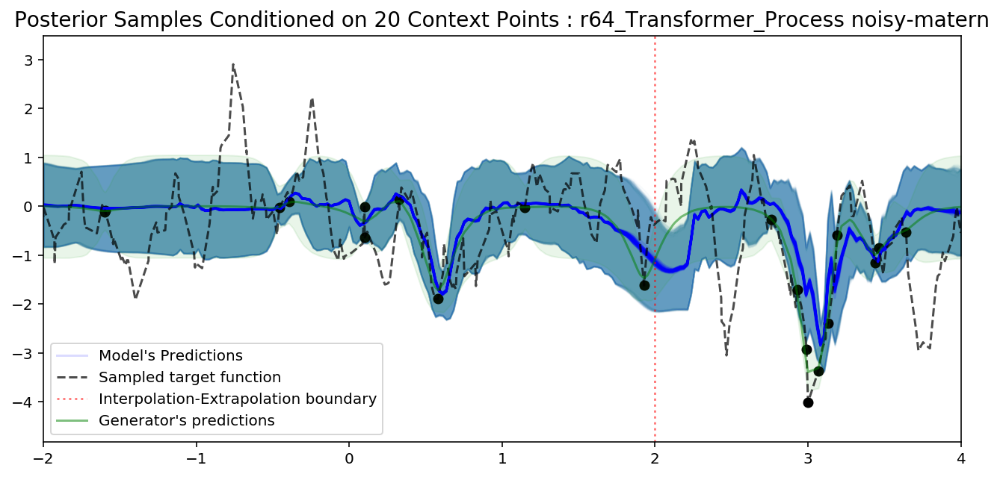

In [32]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

for n_cntxt in [2,10,20]:
    print()
    print("Number of context points:", n_cntxt)
    for k,(neural_proc, dataset) in data_models.items():
        print("Dataset:", k)
        fix_dataset(dataset)  
        for name, neural_proc in models.items():
            plot_posterior_samples(dataset, neural_proc, 
                                   n_cntxt=n_cntxt, 
                                   test_min_max=EXTRAPOLATION_RANGE, 
                                   n_points=2*N_POINTS,
                                   title="Posterior Samples Conditioned on {} Context Points : {} {}".format(n_cntxt, name, k))